

# Audit Prediction with DL




In [1]:
import pyforest

In [2]:
df=pd.read_csv("Audit data.csv",encoding="latin2")

<IPython.core.display.Javascript object>

* https://data.mendeley.com/datasets/mmcczp3g3y/3

In [3]:
df.head()

,Company_id,Year,Unique_identifier,Company_name,Legal_form,Year_of_establishment,Industry_code,Bankruptcy,Restructuring,CEO_id,...,AOP690,AOP691,AOP692,AOP693,AOP694,AOP695,AOP696,AOP697,AOP698,AOP699
0,1,2008,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
1,1,2009,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
2,1,2010,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
3,1,2011,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
4,1,2012,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22394 entries, 0 to 22393
Columns: 411 entries, Company_id to AOP699
dtypes: float64(383), int64(21), object(7)
memory usage: 70.2+ MB


# EDA 

In [5]:
df.isnull().sum().sort_values().tail(10)
# check num missing values   

AOP565                       1
Industry_code              673
Year_of_establishment      679
CEO_id                     848
Audit_opinion             8833
Big4                      8833
Auditor_id                8833
Audit_opinion_1_code      8833
Auditor_name              8833
Auditor_switch           12921
dtype: int64

In [6]:
# check number of unique values in features
for col in df.columns:
    print(col,":",df[col].nunique())

Company_id : 4701
Year : 6
Unique_identifier : 4701
Company_name : 4701
Legal_form : 9
Year_of_establishment : 3005
Industry_code : 399
Bankruptcy : 2
Restructuring : 2
CEO_id : 154
Auditor_switch : 2
Auditor_name : 64
Auditor_id : 64
Big4 : 2
Audit_opinion : 4
Audit_opinion_1_code : 2
AOP001 : 22121
AOP002 : 414
AOP003 : 156
AOP004 : 8481
AOP005 : 21968
AOP006 : 21879
AOP007 : 5117
AOP008 : 1272
AOP009 : 11447
AOP010 : 7529
AOP011 : 7969
AOP012 : 22304
AOP013 : 21076
AOP014 : 2054
AOP015 : 22239
AOP016 : 22049
AOP017 : 7284
AOP018 : 10888
AOP019 : 17903
AOP020 : 16946
AOP021 : 7051
AOP022 : 22365
AOP023 : 2377
AOP024 : 22367
AOP025 : 8390
AOP101 : 19484
AOP102 : 19888
AOP103 : 414
AOP104 : 8477
AOP105 : 6169
AOP106 : 956
AOP107 : 1592
AOP108 : 18638
AOP109 : 8385
AOP110 : 430
AOP111 : 22336
AOP112 : 6744
AOP113 : 14747
AOP114 : 10802
AOP115 : 9164
AOP116 : 22301
AOP117 : 17719
AOP118 : 35
AOP119 : 22140
AOP120 : 17864
AOP121 : 16956
AOP122 : 5245
AOP123 : 6560
AOP124 : 22367
AOP125 : 

In [7]:
# Detect and define columns created from other columns with the help of suplementary pdf
for col in df.select_dtypes(exclude="object").columns:
    print(col,":",df[col].sum())

Company_id : 48829736
Year : 45024096
Unique_identifier : 264972991884
Industry_code : 82410764.0
Bankruptcy : 18
Restructuring : 867
Auditor_id : 387968.0
Big4 : 1507.0
Audit_opinion_1_code : 4421.0
AOP001 : 276559028.6423
AOP002 : 611085.596
AOP003 : 695426.2877000001
AOP004 : 8556655.366799999
AOP005 : 217297829.25129998
AOP006 : 198444009.18129998
AOP007 : 13656555.2074
AOP008 : 4941887.6844
AOP009 : 49229903.624699995
AOP010 : 40891066.8239
AOP011 : 8264478.656699999
AOP012 : 146944559.7095
AOP013 : 42938079.92919999
AOP014 : 1987551.0965999998
AOP015 : 101923209.42860001
AOP016 : 64640132.0762
AOP017 : 374550.8173
AOP018 : 17445298.8854
AOP019 : 11174866.407200001
AOP020 : 8119188.041200001
AOP021 : 1447185.1772
AOP022 : 424988277.9404
AOP023 : 19312236.166
AOP024 : 444549163.5949
AOP025 : 55507570.904300004
AOP101 : 208580969.8958
AOP102 : 159574866.0165
AOP103 : 611085.596
AOP104 : 7516182.075500001
AOP105 : 52868118.989999995
AOP106 : 278293.5065
AOP107 : 767022.9442000001
AOP

In [8]:
AOP_list = pd.Series([1,5,9,12,15,22,111,113,116,124,201,213,214,219,220,223,224,229,230,336,337,338,339,343,610,615,622,633,638,650,671,680,688])

<IPython.core.display.Javascript object>

In [9]:
drop_AOP = AOP_list.apply(lambda x: "AOP"+str(x) if len(str(x))==3 else 
                          ("AOP00"+str(x) if len(str(x))==1 else "AOP0"+str(x)) )

drop_AOP

0     AOP001
1     AOP005
2     AOP009
3     AOP012
4     AOP015
5     AOP022
6     AOP111
7     AOP113
8     AOP116
9     AOP124
10    AOP201
11    AOP213
12    AOP214
13    AOP219
14    AOP220
15    AOP223
16    AOP224
17    AOP229
18    AOP230
19    AOP336
20    AOP337
21    AOP338
22    AOP339
23    AOP343
24    AOP610
25    AOP615
26    AOP622
27    AOP633
28    AOP638
29    AOP650
30    AOP671
31    AOP680
32    AOP688
dtype: object

In [10]:
# Drop columns that are created from others
df.drop(drop_AOP,axis=1,inplace=True)

In [11]:
# Check target column distribution
df.Audit_opinion.value_counts(dropna=False)

Unqualified    9140
NaN            8833
Qualified      3706
Disclaimer      644
Adverse          71
Name: Audit_opinion, dtype: int64

In [12]:
df.Audit_opinion_1_code.value_counts(dropna=False)

0.0    9140
NaN    8833
1.0    4421
Name: Audit_opinion_1_code, dtype: int64

In [13]:
# Focus on missing values
df.Auditor_switch.value_counts(dropna=False)

NaN    12921
No      7475
Yes     1998
Name: Auditor_switch, dtype: int64

In [14]:
df.dropna( how ="any", subset=["Audit_opinion"]).isnull().sum().sort_values()

Company_id                  0
AOP461                      0
AOP462                      0
AOP463                      0
AOP464                      0
                         ... 
AOP564                      1
Industry_code             363
Year_of_establishment     367
CEO_id                    424
Auditor_switch           4088
Length: 378, dtype: int64

In [15]:
# Fill nan values in Auditor_switch with "unknown" to save 4088 rows
df["Auditor_switch"]=df.Auditor_switch.fillna("unknown")

In [16]:
# Drop rows that contains missing value in target column
df.dropna( how ="any", subset=["Audit_opinion"],inplace=True)

In [17]:
df.isnull().sum().sort_values()


Company_id                 0
AOP461                     0
AOP462                     0
AOP463                     0
AOP464                     0
                        ... 
AOP558                     1
AOP541                     1
Industry_code            363
Year_of_establishment    367
CEO_id                   424
Length: 378, dtype: int64

In [18]:
# Drop rest of rows which contains missing values
df.dropna(inplace=True)

In [19]:
df.isnull().sum().sort_values()

Company_id    0
AOP538        0
AOP537        0
AOP536        0
AOP535        0
             ..
AOP404        0
AOP403        0
AOP402        0
AOP411        0
AOP699        0
Length: 378, dtype: int64

In [20]:
df.shape

(13132, 378)

In [21]:
pd.set_option("max_info_columns", 500)
df.info()
pd.reset_option("max_info_columns")

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13132 entries, 2 to 22393
Data columns (total 378 columns):
 #    Column                 Non-Null Count  Dtype  
---   ------                 --------------  -----  
 0    Company_id             13132 non-null  int64  
 1    Year                   13132 non-null  int64  
 2    Unique_identifier      13132 non-null  int64  
 3    Company_name           13132 non-null  object 
 4    Legal_form             13132 non-null  object 
 5    Year_of_establishment  13132 non-null  object 
 6    Industry_code          13132 non-null  float64
 7    Bankruptcy             13132 non-null  int64  
 8    Restructuring          13132 non-null  int64  
 9    CEO_id                 13132 non-null  object 
 10   Auditor_switch         13132 non-null  object 
 11   Auditor_name           13132 non-null  object 
 12   Auditor_id             13132 non-null  float64
 13   Big4                   13132 non-null  float64
 14   Audit_opinion          13132 non-nul

<IPython.core.display.Javascript object>

In [22]:
df

,Company_id,Year,Unique_identifier,Company_name,Legal_form,Year_of_establishment,Industry_code,Bankruptcy,Restructuring,CEO_id,...,AOP690,AOP691,AOP692,AOP693,AOP694,AOP695,AOP696,AOP697,AOP698,AOP699
2,1,2010,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
3,1,2011,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
4,1,2012,6000525,BOMEX EXPORT IMPORT PREDUZE?E ZA PROIZVODNJU ...,Limited liability,1992-06-04,4690.0,0,0,2.10E+11,...,0,0,0,0,0,0,0,0,0,0
8,2,2011,6008933,PREDUZE?E ZA PROIZVODNJU TRGOVINU I USLUGE DEL...,Limited liability,1992-06-15,1414.0,0,0,1.21E+12,...,0,0,0,0,0,0,0,0,0,0
9,2,2012,6008933,PREDUZE?E ZA PROIZVODNJU TRGOVINU I USLUGE DEL...,Limited liability,1992-06-15,1414.0,0,0,1.21E+12,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22387,4698,2012,29502412,AKTOR A.T.E. OGRANAK BEOGRAD (NOVI BEOGRAD),Branch of a foreign company,2010-11-26,4211.0,0,0,Foreigner,...,0,0,0,0,0,0,0,0,0,0
22388,4698,2013,29502412,AKTOR A.T.E. OGRANAK BEOGRAD (NOVI BEOGRAD),Branch of a foreign company,2010-11-26,4211.0,0,0,Foreigner,...,0,0,0,0,0,0,0,0,0,0
22389,4699,2012,29502447,CHINA ROAD AND BRIDGE CORPORATION SERBIA OGRAN...,Branch of a foreign company,2010-12-10,4213.0,0,0,5.04E+11,...,0,0,0,0,0,0,0,0,0,0
22390,4699,2013,29502447,CHINA ROAD AND BRIDGE CORPORATION SERBIA OGRAN...,Branch of a foreign company,2010-12-10,4213.0,0,0,5.04E+11,...,0,0,0,0,0,0,0,0,0,0


In [23]:
# Convert "Year_of_establishment" feature object to datetime
df["Year_of_establishment"] = pd.to_datetime(df["Year_of_establishment"])

<IPython.core.display.Javascript object>

In [24]:
df["Year_of_establishment"].dt.year

2        1992
3        1992
4        1992
8        1992
9        1992
         ... 
22387    2010
22388    2010
22389    2010
22390    2010
22393    2011
Name: Year_of_establishment, Length: 13132, dtype: int64

In [25]:
# Transform "Year_of_establishment" column into only year 
df["Year_of_establishment"] = df["Year_of_establishment"].dt.year

In [26]:
df["Year_of_establishment"]

2        1992
3        1992
4        1992
8        1992
9        1992
         ... 
22387    2010
22388    2010
22389    2010
22390    2010
22393    2011
Name: Year_of_establishment, Length: 13132, dtype: int64

In [27]:
# Create a new column "company_age" and fill it with the ages of the companies in the report year
df["company_age"] = df["Year"] - df["Year_of_establishment"]
df["company_age"]

2        18
3        19
4        20
8        19
9        20
         ..
22387     2
22388     3
22389     2
22390     3
22393     1
Name: company_age, Length: 13132, dtype: int64

In [28]:
# Drop year related columns to reduce complexity
df.drop(["Year", "Year_of_establishment"],axis=1, inplace=True)

In [29]:
# Check and drop columns that you assume prediction power is too low.
pd.set_option("max_info_columns", 500)
df.info()
pd.reset_option("max_info_columns")

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13132 entries, 2 to 22393
Data columns (total 377 columns):
 #    Column                Non-Null Count  Dtype  
---   ------                --------------  -----  
 0    Company_id            13132 non-null  int64  
 1    Unique_identifier     13132 non-null  int64  
 2    Company_name          13132 non-null  object 
 3    Legal_form            13132 non-null  object 
 4    Industry_code         13132 non-null  float64
 5    Bankruptcy            13132 non-null  int64  
 6    Restructuring         13132 non-null  int64  
 7    CEO_id                13132 non-null  object 
 8    Auditor_switch        13132 non-null  object 
 9    Auditor_name          13132 non-null  object 
 10   Auditor_id            13132 non-null  float64
 11   Big4                  13132 non-null  float64
 12   Audit_opinion         13132 non-null  object 
 13   Audit_opinion_1_code  13132 non-null  float64
 14   AOP002                13132 non-null  float64
 15   

<IPython.core.display.Javascript object>

In [30]:
for col in df.columns:
    print(col,":",df[col].nunique())

Company_id : 4146
Unique_identifier : 4146
Company_name : 4146
Legal_form : 9
Industry_code : 396
Bankruptcy : 2
Restructuring : 2
CEO_id : 154
Auditor_switch : 3
Auditor_name : 63
Auditor_id : 63
Big4 : 2
Audit_opinion : 4
Audit_opinion_1_code : 2
AOP002 : 233
AOP003 : 117
AOP004 : 5480
AOP006 : 12937
AOP007 : 3227
AOP008 : 796
AOP010 : 4604
AOP011 : 4966
AOP013 : 12578
AOP014 : 1412
AOP016 : 13019
AOP017 : 4646
AOP018 : 6924
AOP019 : 11125
AOP020 : 10536
AOP021 : 4759
AOP023 : 1263
AOP024 : 13118
AOP025 : 5497
AOP101 : 11754
AOP102 : 11757
AOP103 : 233
AOP104 : 5306
AOP105 : 3774
AOP106 : 604
AOP107 : 1026
AOP108 : 11338
AOP109 : 4682
AOP110 : 302
AOP112 : 4549
AOP114 : 6695
AOP115 : 5628
AOP117 : 10589
AOP118 : 24
AOP119 : 13039
AOP120 : 10725
AOP121 : 10425
AOP122 : 3631
AOP123 : 4342
AOP125 : 5497
AOP202 : 12834
AOP203 : 4075
AOP204 : 3466
AOP205 : 2732
AOP206 : 8459
AOP207 : 13110
AOP208 : 10032
AOP209 : 12766
AOP210 : 12871
AOP211 : 12359
AOP212 : 12946
AOP215 : 11040
AOP216 : 1

In [31]:
df.drop(["Company_id","Unique_identifier","Company_name"],axis=1,inplace=True)

In [32]:
pd.set_option("max_info_columns", 500)
df.info()
pd.reset_option("max_info_columns")

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13132 entries, 2 to 22393
Data columns (total 374 columns):
 #    Column                Non-Null Count  Dtype  
---   ------                --------------  -----  
 0    Legal_form            13132 non-null  object 
 1    Industry_code         13132 non-null  float64
 2    Bankruptcy            13132 non-null  int64  
 3    Restructuring         13132 non-null  int64  
 4    CEO_id                13132 non-null  object 
 5    Auditor_switch        13132 non-null  object 
 6    Auditor_name          13132 non-null  object 
 7    Auditor_id            13132 non-null  float64
 8    Big4                  13132 non-null  float64
 9    Audit_opinion         13132 non-null  object 
 10   Audit_opinion_1_code  13132 non-null  float64
 11   AOP002                13132 non-null  float64
 12   AOP003                13132 non-null  float64
 13   AOP004                13132 non-null  float64
 14   AOP006                13132 non-null  float64
 15   

<IPython.core.display.Javascript object>

In [33]:
df.drop(["CEO_id","Auditor_name","Auditor_id"],axis=1,inplace=True)

In [34]:
# Detect and correct the type of object columns
df.select_dtypes(include="object")

,Legal_form,Auditor_switch,Audit_opinion
2,Limited liability,unknown,Unqualified
3,Limited liability,No,Qualified
4,Limited liability,Yes,Adverse
8,Limited liability,unknown,Unqualified
9,Limited liability,No,Unqualified
...,...,...,...
22387,Branch of a foreign company,No,Disclaimer
22388,Branch of a foreign company,No,Qualified
22389,Branch of a foreign company,No,Unqualified
22390,Branch of a foreign company,Yes,Qualified


In [35]:
df.head()

,Legal_form,Industry_code,Bankruptcy,Restructuring,Auditor_switch,Big4,Audit_opinion,Audit_opinion_1_code,AOP002,AOP003,...,AOP691,AOP692,AOP693,AOP694,AOP695,AOP696,AOP697,AOP698,AOP699,company_age
2,Limited liability,4690.0,0,0,unknown,0.0,Unqualified,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,18
3,Limited liability,4690.0,0,0,No,0.0,Qualified,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,19
4,Limited liability,4690.0,0,0,Yes,0.0,Adverse,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,20
8,Limited liability,1414.0,0,0,unknown,0.0,Unqualified,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,19
9,Limited liability,1414.0,0,0,No,0.0,Unqualified,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,20


In [36]:
df["Industry_code"] = df["Industry_code"].astype("str")
df["Bankruptcy"] = df["Bankruptcy"].astype("str")
df["Big4"] = df["Big4"].astype("str")
df["Restructuring"] = df["Restructuring"].astype("str")

In [37]:
df.select_dtypes(include="object")

,Legal_form,Industry_code,Bankruptcy,Restructuring,Auditor_switch,Big4,Audit_opinion
2,Limited liability,4690.0,0,0,unknown,0.0,Unqualified
3,Limited liability,4690.0,0,0,No,0.0,Qualified
4,Limited liability,4690.0,0,0,Yes,0.0,Adverse
8,Limited liability,1414.0,0,0,unknown,0.0,Unqualified
9,Limited liability,1414.0,0,0,No,0.0,Unqualified
...,...,...,...,...,...,...,...
22387,Branch of a foreign company,4211.0,0,0,No,0.0,Disclaimer
22388,Branch of a foreign company,4211.0,0,0,No,0.0,Qualified
22389,Branch of a foreign company,4213.0,0,0,No,0.0,Unqualified
22390,Branch of a foreign company,4213.0,0,0,Yes,0.0,Qualified


In [38]:
pd.set_option("max_info_columns", 500)
df.info()
pd.reset_option("max_info_columns")

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13132 entries, 2 to 22393
Data columns (total 371 columns):
 #    Column                Non-Null Count  Dtype  
---   ------                --------------  -----  
 0    Legal_form            13132 non-null  object 
 1    Industry_code         13132 non-null  object 
 2    Bankruptcy            13132 non-null  object 
 3    Restructuring         13132 non-null  object 
 4    Auditor_switch        13132 non-null  object 
 5    Big4                  13132 non-null  object 
 6    Audit_opinion         13132 non-null  object 
 7    Audit_opinion_1_code  13132 non-null  float64
 8    AOP002                13132 non-null  float64
 9    AOP003                13132 non-null  float64
 10   AOP004                13132 non-null  float64
 11   AOP006                13132 non-null  float64
 12   AOP007                13132 non-null  float64
 13   AOP008                13132 non-null  float64
 14   AOP010                13132 non-null  float64
 15   

<IPython.core.display.Javascript object>

In [39]:
df.describe()

,Audit_opinion_1_code,AOP002,AOP003,AOP004,AOP006,AOP007,AOP008,AOP010,AOP011,AOP013,...,AOP691,AOP692,AOP693,AOP694,AOP695,AOP696,AOP697,AOP698,AOP699,company_age
count,13132.000000,13132.000000,13132.000000,13132.000000,1.313200e+04,13132.000000,13132.000000,1.313200e+04,13132.000000,13132.000000,...,13132.000000,1.313200e+04,1.313200e+04,13132.000000,13132.000000,1.313200e+04,13132.000000,13132.000000,13132.000000,13132.000000
mean,0.322495,24.328470,42.458674,405.744669,7.861990e+03,641.736812,235.475604,1.868777e+03,424.372752,2030.436970,...,230.348538,9.261925e+02,1.703049e+03,56.407935,350.752818,1.408704e+03,2.700883,2.824931,1.586582,15.693345
std,0.467449,1405.927493,1996.140718,5465.414763,8.400120e+04,6347.291457,8566.248673,4.829494e+04,6858.883322,8563.920893,...,7148.913023,3.668773e+04,4.120485e+04,1205.014440,6706.817154,3.909132e+04,127.998043,183.245298,113.985361,11.178968
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,3.615491e+02,0.000000,0.000000,0.000000e+00,0.000000,115.895375,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,9.000000
50%,0.000000,0.000000,0.000000,0.306800,1.143658e+03,0.000000,0.000000,0.000000e+00,0.000000,542.183150,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,13.000000
75%,1.000000,0.000000,0.000000,13.241900,3.094480e+03,0.000000,0.000000,1.209965e+01,14.296925,1465.863950,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,20.000000
max,1.000000,150800.004200,208023.623100,217999.596200,4.094721e+06,323282.760400,500953.976900,2.806065e+06,310704.116300,383464.983200,...,731768.000000,3.478877e+06,2.605005e+06,64490.000000,311561.000000,2.523660e+06,12696.000000,16906.000000,12696.000000,95.000000


In [40]:
# Check the corelation between target and feature columns
import plotly.express as px
fig = px.bar(x=df.corr()["Audit_opinion_1_code"].sort_values(), y= df.corr()["Audit_opinion_1_code"].sort_values().index)
fig.show()
# df.corr()["Audit_opinion_1_code"].sort_values().plot.barh(figsize=(20,20))

In [41]:
# Check multicollinearity
fig = px.imshow(df.corr(),
                x= df.select_dtypes(exclude="object").columns,
                y= df.select_dtypes(exclude="object").columns
               )
fig.update_xaxes(side="top")
fig.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<AxesSubplot:>

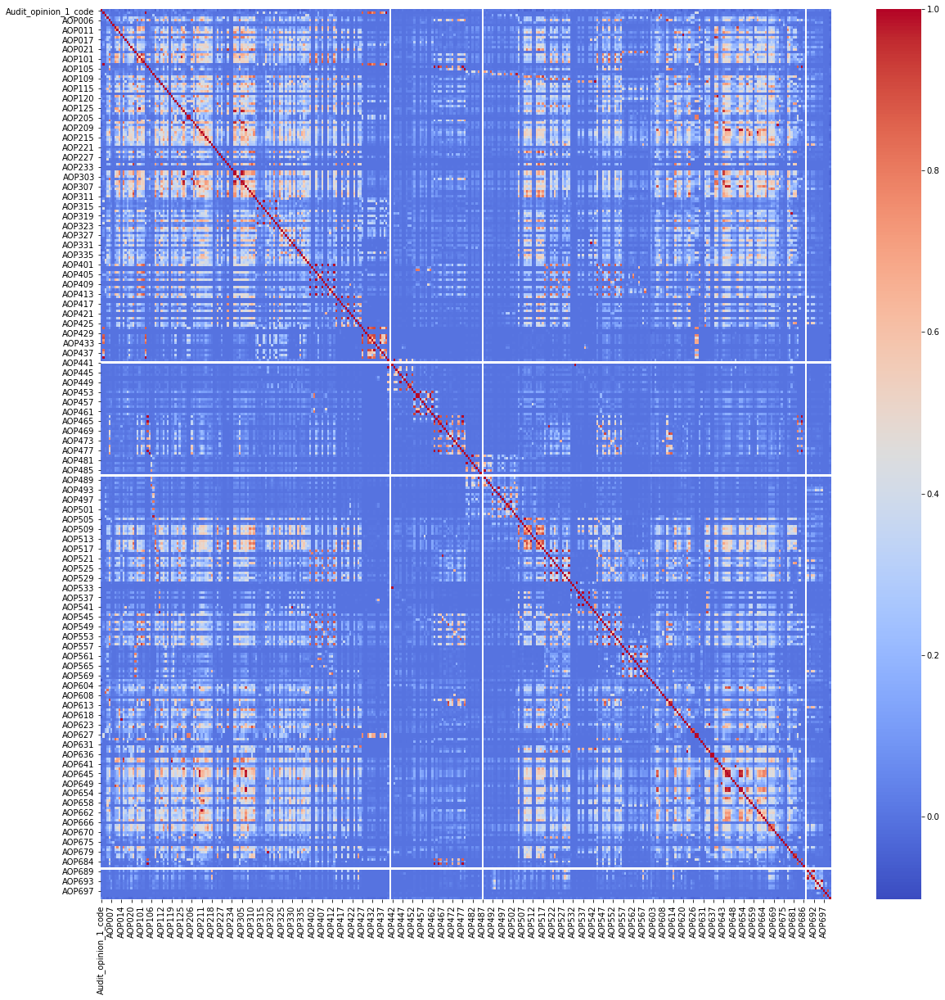

In [42]:
# Check multicollinearity
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),cmap="coolwarm")

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
from sklearn.metrics import classification_report, confusion_matrix

# Data Preprocessing 

In [44]:
# No need to use values attribute bc we will scale the data
X = df.drop(["Audit_opinion_1_code","Audit_opinion"],axis=1)
y = df.Audit_opinion_1_code

In [45]:
X = pd.get_dummies(X,drop_first=True)

<IPython.core.display.Javascript object>

In [46]:
X.shape

(13132, 771)

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20,random_state=6)

In [48]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Model-1 (Straight Forward)

In [49]:
model = Sequential()
model.add(Dense(48, activation="relu"))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(1, activation="sigmoid"))
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["Recall"])

In [50]:
model.fit(x=X_train_scaled, y=y_train, epochs=100, 
          validation_data=(X_test_scaled, y_test), verbose=1)

Epoch 1/100
329/329 [==============================] - 1s 1ms/step - loss: 0.5944 - recall: 0.1927 - val_loss: 0.5567 - val_recall: 0.2862
Epoch 2/100
329/329 [==============================] - 0s 906us/step - loss: 0.5436 - recall: 0.3339 - val_loss: 0.5504 - val_recall: 0.3362
Epoch 3/100
329/329 [==============================] - 0s 1ms/step - loss: 0.5247 - recall: 0.3802 - val_loss: 0.5536 - val_recall: 0.4434
Epoch 4/100
329/329 [==============================] - 0s 915us/step - loss: 0.5100 - recall: 0.4033 - val_loss: 0.5447 - val_recall: 0.3873
Epoch 5/100
329/329 [==============================] - 0s 1ms/step - loss: 0.4963 - recall: 0.4417 - val_loss: 0.5424 - val_recall: 0.4105
Epoch 6/100
329/329 [==============================] - 0s 1ms/step - loss: 0.4812 - recall: 0.4649 - val_loss: 0.5371 - val_recall: 0.3678
Epoch 7/100
329/329 [==============================] - 0s 1ms/step - loss: 0.4663 - recall: 0.4938 - val_loss: 0.5415 - val_recall: 0.4032
Epoch 8/100
329/329 [==

329/329 [==============================] - 0s 1ms/step - loss: 0.2527 - recall: 0.7624 - val_loss: 1.1474 - val_recall: 0.5225
Epoch 60/100
329/329 [==============================] - 0s 1ms/step - loss: 0.2506 - recall: 0.7715 - val_loss: 1.1411 - val_recall: 0.5238
Epoch 61/100
329/329 [==============================] - 0s 998us/step - loss: 0.2490 - recall: 0.7683 - val_loss: 1.1497 - val_recall: 0.5457
Epoch 62/100
329/329 [==============================] - 0s 978us/step - loss: 0.2509 - recall: 0.7750 - val_loss: 1.1540 - val_recall: 0.5347
Epoch 63/100
329/329 [==============================] - 0s 1ms/step - loss: 0.2489 - recall: 0.7721 - val_loss: 1.1910 - val_recall: 0.5676
Epoch 64/100
329/329 [==============================] - 0s 1ms/step - loss: 0.2418 - recall: 0.7806 - val_loss: 1.1960 - val_recall: 0.5664
Epoch 65/100
329/329 [==============================] - 0s 1ms/step - loss: 0.2411 - recall: 0.7762 - val_loss: 1.2408 - val_recall: 0.5043
Epoch 66/100
329/329 [=======

## Evaluate-1

In [51]:
model_loss = pd.DataFrame(model.history.history)
model_loss.head()

<IPython.core.display.Javascript object>

,loss,recall,val_loss,val_recall
0,0.594371,0.192736,0.556664,0.286236
1,0.543622,0.333919,0.550425,0.336175
2,0.524707,0.380199,0.553637,0.443362
3,0.509997,0.403339,0.544740,0.387333
4,0.496345,0.441711,0.542431,0.410475


<AxesSubplot:>

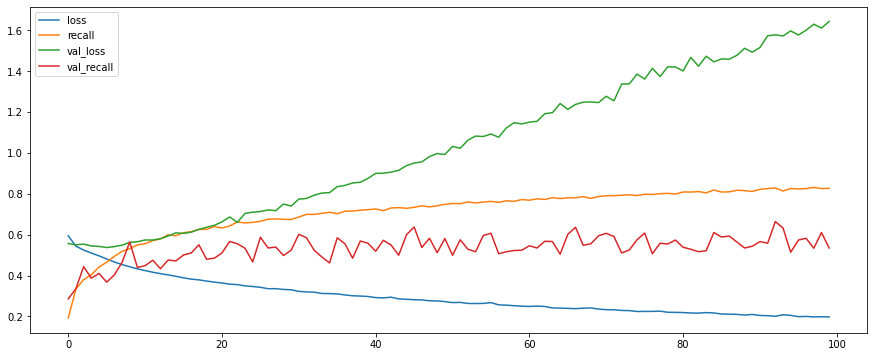

In [52]:
model_loss.plot(figsize=(15,6))

In [53]:
predictions = model.predict_classes(X_test_scaled)
predictions_train = model.predict_classes(X_train_scaled)

C:\Users\NIO\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:455: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



In [54]:
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

print(confusion_matrix(y_train, predictions_train))
print(classification_report(y_train, predictions_train))

[[1577  229]
 [ 382  439]]
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.84      1806
         1.0       0.66      0.53      0.59       821

    accuracy                           0.77      2627
   macro avg       0.73      0.70      0.71      2627
weighted avg       0.76      0.77      0.76      2627

[[6913  178]
 [ 636 2778]]
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.94      7091
         1.0       0.94      0.81      0.87      3414

    accuracy                           0.92     10505
   macro avg       0.93      0.89      0.91     10505
weighted avg       0.92      0.92      0.92     10505



#  Model-2 (Early Stop)

In [55]:
model = Sequential()
model.add(Dense(48, activation="relu"))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(1, activation="sigmoid"))
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["Recall"])

In [56]:
pd.Series(y_train).value_counts(normalize=True)

<IPython.core.display.Javascript object>

0.0    0.675012
1.0    0.324988
Name: Audit_opinion_1_code, dtype: float64

In [57]:
pd.Series(y_train).value_counts(normalize=True)

weights = {0:32, 1:68}
weights

<IPython.core.display.Javascript object>

{0: 32, 1: 68}

In [58]:
early_stop = EarlyStopping(monitor="val_loss", mode="auto", verbose=1, 
                           patience = 50,restore_best_weights=True)

In [59]:
model.fit(x=X_train_scaled, y=y_train, epochs=150, 
          validation_data=(X_test_scaled, y_test), 
          verbose=1,class_weight = weights, callbacks=[early_stop])

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Epoch 1/150
329/329 [==============================] - 1s 2ms/step - loss: 28.2282 - recall: 0.5460 - val_loss: 0.6952 - val_recall: 0.7783
Epoch 2/150
329/329 [==============================] - 0s 1ms/step - loss: 25.9266 - recall: 0.6766 - val_loss: 0.6223 - val_recall: 0.6833
Epoch 3/150
329/329 [==============================] - 0s 1ms/step - loss: 24.8587 - recall: 0.6942 - val_loss: 0.6312 - val_recall: 0.7052
Epoch 4/150
329/329 [==============================] - 0s 1ms/step - loss: 24.0951 - recall: 0.7086 - val_loss: 0.5869 - val_recall: 0.6102
Epoch 5/150
329/329 [==============================] - 0s 1ms/step - loss: 23.1906 - recall: 0.7273 - val_loss: 0.6518 - val_recall: 0.7345
Epoch 6/150
329/329 [==============================] - 0s 1ms/step - loss: 22.5900 - recall: 0.7422 - val_loss: 0.6192 - val_recall: 0.6955
Epoch 7/150
329/329 [=

## Evaluate-2

In [60]:
model_loss = pd.DataFrame(model.history.history)
model_loss.tail()

<IPython.core.display.Javascript object>

,loss,recall,val_loss,val_recall
49,12.031754,0.875805,1.292296,0.610231
50,11.941220,0.875805,1.331535,0.676005
51,11.886735,0.880492,1.337945,0.683313
52,11.769349,0.876684,1.413047,0.736906
53,11.857404,0.880199,1.417760,0.638246


<AxesSubplot:>

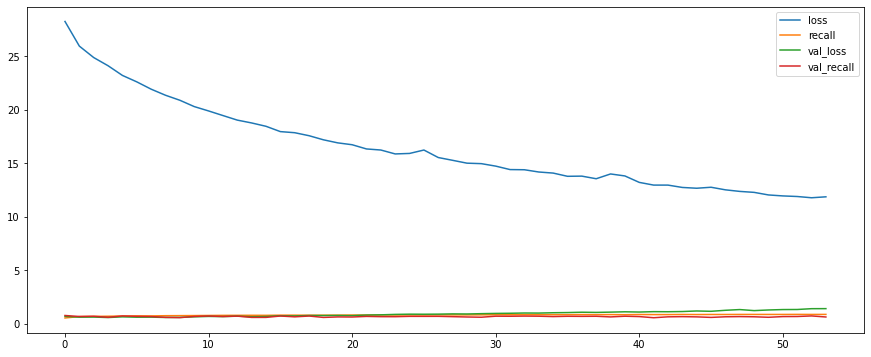

In [61]:
model_loss.plot(figsize=(15,6))

* https://machinelearningmastery.com/learning-curves-for-diagnosing-machine-learning-model-performance/

In [62]:
predictions = model.predict_classes(X_test_scaled)
predictions_train = model.predict_classes(X_train_scaled)

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

print(confusion_matrix(y_train, predictions_train))
print(classification_report(y_train, predictions_train))

C:\Users\NIO\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:455: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



[[1341  465]
 [ 320  501]]
              precision    recall  f1-score   support

         0.0       0.81      0.74      0.77      1806
         1.0       0.52      0.61      0.56       821

    accuracy                           0.70      2627
   macro avg       0.66      0.68      0.67      2627
weighted avg       0.72      0.70      0.71      2627

[[5618 1473]
 [1132 2282]]
              precision    recall  f1-score   support

         0.0       0.83      0.79      0.81      7091
         1.0       0.61      0.67      0.64      3414

    accuracy                           0.75     10505
   macro avg       0.72      0.73      0.72     10505
weighted avg       0.76      0.75      0.75     10505



# Model-3 (Early Stop with Drop Out)

In [63]:
model = Sequential()
model.add(Dense(24, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(24, activation="relu"))
model.add(Dropout(0.2))

model.add(Dense(12, activation="relu"))
model.add(Dropout(0.4))

model.add(Dense(24, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(24, activation="relu"))
model.add(Dropout(0.2))

model.add(Dense(12, activation="relu"))
model.add(Dropout(0.4))


model.add(Dense(1, activation="sigmoid"))

opt1 = tf.keras.optimizers.Adam(learning_rate=0.001)
opt2 = tf.keras.optimizers.Adamax(learning_rate=0.001)
model.compile(loss="binary_crossentropy", optimizer=opt1, metrics=["Recall"])

In [64]:
early_stop = EarlyStopping(monitor="val_loss", mode="min", 
                           verbose=1, patience = 25, restore_best_weights=True)

In [65]:
model.fit(x=X_train_scaled, y=y_train, epochs=600, 
          validation_data=(X_test_scaled, y_test), 
          verbose=1, class_weight = weights, callbacks=[early_stop])

Epoch 1/600
329/329 [==============================] - 1s 2ms/step - loss: 30.1761 - recall: 0.4757 - val_loss: 0.6908 - val_recall: 0.8477
Epoch 2/600
329/329 [==============================] - 1s 2ms/step - loss: 29.7676 - recall: 0.7211 - val_loss: 0.6808 - val_recall: 0.7759
Epoch 3/600
329/329 [==============================] - 1s 2ms/step - loss: 28.9074 - recall: 0.7182 - val_loss: 0.6429 - val_recall: 0.5822
Epoch 4/600
329/329 [==============================] - 0s 1ms/step - loss: 28.5654 - recall: 0.7042 - val_loss: 0.6658 - val_recall: 0.6309
Epoch 5/600
329/329 [==============================] - 0s 1ms/step - loss: 27.8612 - recall: 0.6968 - val_loss: 0.6685 - val_recall: 0.6797
Epoch 6/600
329/329 [==============================] - 0s 1ms/step - loss: 27.6489 - recall: 0.6860 - val_loss: 0.6514 - val_recall: 0.6382
Epoch 7/600
329/329 [==============================] - 0s 1ms/step - loss: 27.4429 - recall: 0.6737 - val_loss: 0.6796 - val_recall: 0.6906
Epoch 8/600
329/329 

## Evaluate-3

In [66]:
model_loss = pd.DataFrame(model.history.history)
model_loss.tail()

<IPython.core.display.Javascript object>

,loss,recall,val_loss,val_recall
34,24.048567,0.751025,0.664902,0.778319
35,23.944183,0.747217,0.649014,0.750305
36,23.779285,0.761277,0.644924,0.734470
37,23.586964,0.738137,0.686863,0.833130
38,23.754322,0.780316,0.642558,0.747868


<AxesSubplot:>

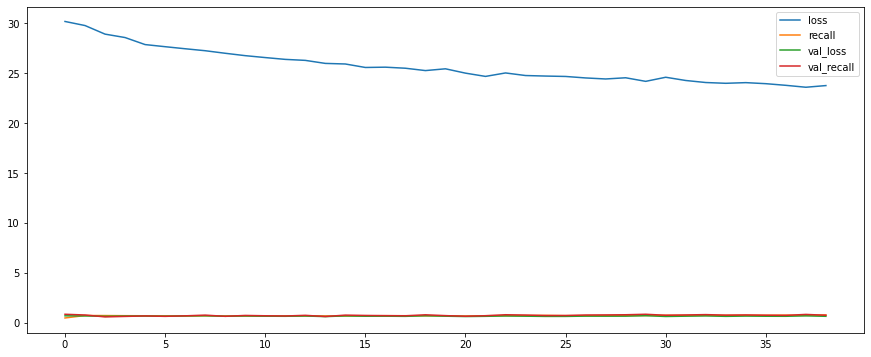

In [67]:

model_loss.plot(figsize=(15,6))

In [68]:
predictions = model.predict_classes(X_test_scaled)
predictions_train = model.predict_classes(X_train_scaled)

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

print(confusion_matrix(y_train, predictions_train))
print(classification_report(y_train, predictions_train))

C:\Users\NIO\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:455: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



[[1331  475]
 [ 311  510]]
              precision    recall  f1-score   support

         0.0       0.81      0.74      0.77      1806
         1.0       0.52      0.62      0.56       821

    accuracy                           0.70      2627
   macro avg       0.66      0.68      0.67      2627
weighted avg       0.72      0.70      0.71      2627

[[5480 1611]
 [1133 2281]]
              precision    recall  f1-score   support

         0.0       0.83      0.77      0.80      7091
         1.0       0.59      0.67      0.62      3414

    accuracy                           0.74     10505
   macro avg       0.71      0.72      0.71     10505
weighted avg       0.75      0.74      0.74     10505



---
---

# ML Comparision

## XGBoost

In [69]:
from xgboost import XGBClassifier

In [70]:
xgb = XGBClassifier()

In [71]:
xgb.fit(X_train_scaled,y_train)

C:\Users\NIO\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[23:22:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=12, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [72]:
predictions = xgb.predict(X_test_scaled)
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

[[1615  191]
 [ 386  435]]
              precision    recall  f1-score   support

         0.0       0.81      0.89      0.85      1806
         1.0       0.69      0.53      0.60       821

    accuracy                           0.78      2627
   macro avg       0.75      0.71      0.72      2627
weighted avg       0.77      0.78      0.77      2627



## Logistic Regression

In [73]:
from sklearn.linear_model import LogisticRegression

In [74]:
log_mod = LogisticRegression(class_weight="balanced", max_iter=5000)

In [75]:
log_mod.fit(X_train_scaled,y_train)

LogisticRegression(class_weight='balanced', max_iter=5000)

In [76]:
predictions = log_mod.predict(X_test_scaled)
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

[[1200  606]
 [ 302  519]]
              precision    recall  f1-score   support

         0.0       0.80      0.66      0.73      1806
         1.0       0.46      0.63      0.53       821

    accuracy                           0.65      2627
   macro avg       0.63      0.65      0.63      2627
weighted avg       0.69      0.65      0.67      2627

